<a href="https://colab.research.google.com/github/poojashreeNS/SmartCultivation/blob/main/CMPE_256_Crop_Prediction_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***Created On Tuesday Nov 16 2021***

***@Authors : Poojashree NS : poojashree.ns@sjsu.edu***

#***Crop Prediction using soil and climate attribute***

# **Imports**

***Reinstalling xgboost as default is older version, which causes modeling problem***

In [ ]:
!pip uninstall xgboost

In [ ]:
!pip install xgboost

***Imports required for the project***

In [5]:
import os
import numpy as np
import pandas as pd
from statistics import mean, stdev

import matplotlib.pyplot as plt
import seaborn as sb
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import iplot
import plotly.io as pio

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.preprocessing import OneHotEncoder

from sklearn import linear_model, tree, ensemble
from sklearn.naive_bayes import GaussianNB
import xgboost
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import VotingClassifier

import pickle

***Data gathering***

In [3]:
CROP_DATA_PATH = "/content/Crop_dataset.csv"
SOIL_DATA_PATH = "/content/soil_dataset.csv"

# **Data Understanding and Preprocessing**

In [6]:
crop=pd.read_csv(CROP_DATA_PATH)
crop.head()

,N,P,K,temperature,humidity,ph,rainfall,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,rice
1,85,58,41,21.770462,80.319644,7.038096,226.655537,rice
2,60,55,44,23.004459,82.320763,7.840207,263.964248,rice
3,74,35,40,26.491096,80.158363,6.980401,242.864034,rice
4,78,42,42,20.130175,81.604873,7.628473,262.717340,rice


In [7]:
soil=pd.read_csv(SOIL_DATA_PATH)
soil.head()

,crop,soil
0,rice,loamy
1,rice,clayey
2,maize,loamy
3,maize,clayey
4,kidneybeans,sandy


In [8]:
soil.rename(columns = {'crop':'label'}, inplace = True)
soil.head()

,label,soil
0,rice,loamy
1,rice,clayey
2,maize,loamy
3,maize,clayey
4,kidneybeans,sandy


***Merging 2 datasets into one***

In [9]:
final = pd.merge(crop, soil, on ='label')
final = final[[ 'N', 'P', 'K','temperature', 'humidity', 'ph', 'rainfall', 'soil','label']]
final.to_csv("./Crop_Prediction_Dataset.csv",index=False)

***Reading data from CSV***

In [10]:
DATA_PATH = "/content/Crop_Prediction_Dataset.csv"
df = pd.read_csv(DATA_PATH)
df.head()

,N,P,K,temperature,humidity,ph,rainfall,soil,label
0,90,42,43,20.879744,82.002744,6.502985,202.935536,loamy,rice
1,90,42,43,20.879744,82.002744,6.502985,202.935536,clayey,rice
2,85,58,41,21.770462,80.319644,7.038096,226.655537,loamy,rice
3,85,58,41,21.770462,80.319644,7.038096,226.655537,clayey,rice
4,60,55,44,23.004459,82.320763,7.840207,263.964248,loamy,rice


***.info() provides the info about the attributes***

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3500 entries, 0 to 3499
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   N            3500 non-null   int64  
 1   P            3500 non-null   int64  
 2   K            3500 non-null   int64  
 3   temperature  3500 non-null   float64
 4   humidity     3500 non-null   float64
 5   ph           3500 non-null   float64
 6   rainfall     3500 non-null   float64
 7   soil         3500 non-null   object 
 8   label        3500 non-null   object 
dtypes: float64(4), int64(3), object(2)
memory usage: 246.2+ KB


ATTRIBUTES

*   **N** - Ratio of Nitrogen content in soil


*   **P** - Ratio of Phosphorous content in soil


*   **K** - Ratio of Potassium content in soil


*   **Temperature** - Temperature in degree celsius required for crop


*   **Humidity** - Relative humidity in perccentage required for crop


*   **ph** - ph value of the soil


*   **Rainfall** - Rainfall in mm


*   **Soil** - Different type of soil requied for crop



In [12]:
print('Data has {} rows and {} columns'.format(df.shape[0], df.shape[1]))

Data has 3500 rows and 9 columns


***.nunique Number of unique values for each variables.***

In [13]:
df.nunique(axis=0)

N               136
P                91
K                51
temperature    1900
humidity       1900
ph             1900
rainfall       1900
soil              5
label            19
dtype: int64

***.describe() summarizes the count, mean, standard deviation, min, and max for numeric variables.***

In [14]:
df.describe(include="all")

,N,P,K,temperature,humidity,ph,rainfall,soil,label
count,3500.000000,3500.000000,3500.000000,3500.000000,3500.000000,3500.000000,3500.000000,3500,3500
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,19
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,loamy,jute
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1600,300
mean,54.222857,45.121714,30.279429,26.135998,69.964271,6.401516,118.314388,NaN,NaN
std,37.180427,21.230065,12.312065,4.671626,21.723374,0.735295,58.758336,NaN,NaN
min,0.000000,5.000000,5.000000,10.010813,18.092240,3.504752,20.211267,NaN,NaN
25%,22.000000,27.000000,20.000000,23.502791,56.497939,5.907931,69.610614,NaN,NaN
50%,40.000000,47.000000,27.000000,25.848029,76.555456,6.413544,106.158201,NaN,NaN
75%,87.250000,61.000000,40.000000,28.636212,87.882553,6.876573,163.997628,NaN,NaN


***Finding Null Values***

In [15]:
df.apply(lambda x: sum(x.isnull()),axis=0)

N              0
P              0
K              0
temperature    0
humidity       0
ph             0
rainfall       0
soil           0
label          0
dtype: int64

***Encoding categorical values***

In [16]:
from sklearn.preprocessing import LabelEncoder
soil_labelencoder = LabelEncoder()
target_labelencoder = LabelEncoder()

df['label_Cat'] = target_labelencoder.fit_transform(df['label'])

df['soil_Cat'] = soil_labelencoder.fit_transform(df['soil'])

df.info

label_encoder_file = 'label_encoder.sav'
pickle.dump(target_labelencoder, open(label_encoder_file, 'wb'))

Soil type is converted from categorical to numerical value based on alphabetical order.


1.   Black soil - 0
2.   Clayey soil - 1
3.   Loamy soil - 2
4.   Red soil - 3
5.   Sandy soil - 4



# **Data Visualization**

In [17]:
import IPython
import time

def display_HTML_files(fig, file_name, path):
  pio.write_html(fig, file=file_name, auto_open=False)
 # time.sleep(10)
  return IPython.display.HTML(filename=path)

In [18]:
# Data distribution
labels = df["label"].unique()

fig = {
  "data": [
    {
      "labels": labels,
      "domain": {"x": [0, .5]},
      "name": "Crops",
      "hoverinfo":"label+name",
      "hole": .3,
      "type": "pie"
    },],
  "layout": {
        "title":"Crop dataset",
        "template":"plotly_dark",
        "annotations": [
            { "font": { "size": 20},
              "showarrow": False,
              "text": "Data Distribution",
                "x": 0.60,
                "y": 1
            },
        ]
    }
}
# iplot(fig)

display_HTML_files(fig, 'data_distribution.html', '/content/data_distribution.html')

From the above plot, we will understand that the data is completely balanced

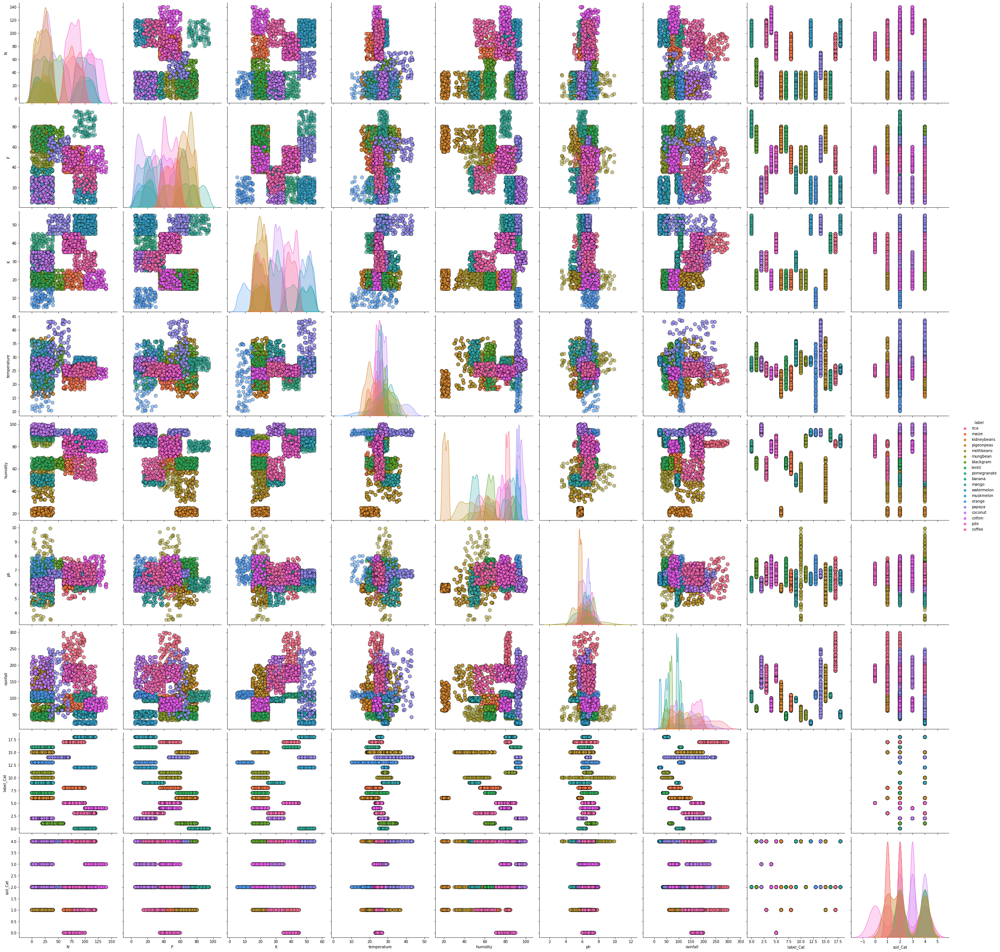

In [19]:
# Pair-plot understand feature distribution.
sb.pairplot(df, hue = 'label', diag_kind = 'kde',
             plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},
             height = 4)

**Corelation matrix**

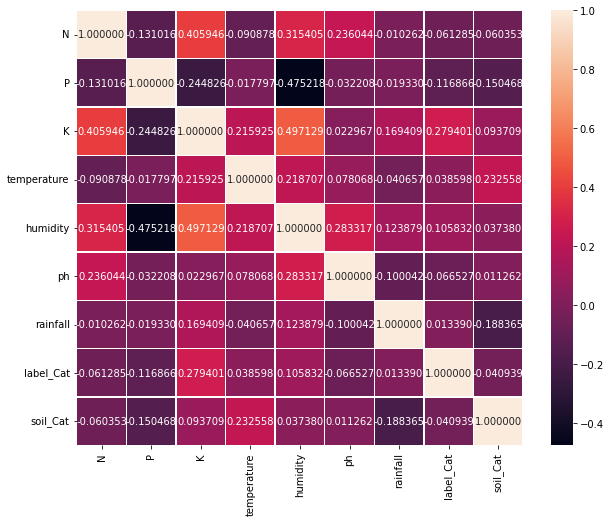

In [20]:
# Correlation matrix to understand feature relation.
correlation_mat = df.corr()
correlation_mat
plt.figure(figsize=(10,8))
sb.heatmap(correlation_mat, linewidths=.5,annot=True, fmt="f")

## ***Bivariate Analysis***

In [21]:
# Boxplot for soil properties:

fig = go.Figure()

# Add Traces:
fig.add_trace(go.Box(x=df['label'], y=df['N']))
fig.add_trace(go.Box(x=df['label'], y=df['K'], visible=False))  
fig.add_trace(go.Box(x=df['label'], y=df['P'], visible=False)) 
fig.add_trace(go.Box(x=df['label'], y=df['ph'], visible=False))
fig.add_trace(go.Box(x=df['label'], y=df['soil_Cat'], visible=False)) 

# Add Buttons:
fig.update_layout(
    updatemenus=[
        dict(
            active=1,
            buttons=list([ 
                
                dict(label='Nitrogen - N',
                     method='update',
                     args=[{'visible': [True, False,False,False, False]},
                           {'title': 'Boxplots for Soil Properties - Nitrogen'}]),
  
                dict(label='Phosphorous - K',
                     method='update',
                     args=[{'visible': [False, True, False, False, False]},
                           {'title': 'Boxplots for Soil Properties - Potassium'}]),
                
                dict(label='Potassium - P',
                     method='update',
                     args=[{'visible': [False, False, True, False, False]},
                           {'title': 'Boxplots for Soil Properties - Phosphorus'}]),
                
                dict(label='ph',
                     method='update',
                     args=[{'visible': [False, False, False, True, False]},
                           {'title': 'Boxplots for Soil Properties - pH'}]),
                          
                dict(label='soil',
                     method='update',
                     args=[{'visible': [False, False, False, False, True]},
                           {'title': 'Boxplots for Soil Properties - soil'}]),           
                
               
            ]),
        )
    ])

# Set title:
fig.update_layout(title_text='Boxplots for Soil Properties', template='plotly_dark', height=500, width=900)

# fig.show()
display_HTML_files(fig, 'Feature_bi_variate_soil_properties.html', '/content/Feature_bi_variate_soil_properties.html')

In [22]:
# Boxplot with dropdown menu for main features:

fig = go.Figure()

# Add Traces

fig.add_trace(go.Box(x=df['label'], y=df['temperature']))
fig.add_trace(go.Box(x=df['label'], y=df['humidity'], visible=False))  
fig.add_trace(go.Box(x=df['label'], y=df['rainfall'], visible=False))  

# Add Buttons

fig.update_layout(
    updatemenus=[
        dict(
            active=1,
            buttons=list([ 
                
                dict(label='temperature',
                     method='update',
                     args=[{'visible': [True, False,False]},
                           {'title': 'Boxplot for Climate - temperature'}]),
  
                dict(label='humidity',
                     method='update',
                     args=[{'visible': [False, True, False]},
                           {'title': 'Boxplot for Climate - humidity'}]),
                
                dict(label='rainfall',
                     method='update',
                     args=[{'visible': [False, False, True]},
                           {'title': 'Boxplot for Climate - rainfall'}]),
                
               
            ]),
        )
    ])

# Set title
fig.update_layout(title_text='Boxplot for Climate', template='plotly_dark', width=900, height=500)

# fig.show()
display_HTML_files(fig, 'Feature_bi_variate_climate_properties.html', '/content/Feature_bi_variate_climate_properties.html')

## ***Univariate Analysis***

In [23]:
fig = go.Figure()

fig.add_trace(go.Histogram(x=df['N']))
fig.add_trace(go.Histogram(x=df['K']))
fig.add_trace(go.Histogram(x=df['P']))
fig.add_trace(go.Histogram(x=df['temperature']))
fig.add_trace(go.Histogram(x=df['humidity']))
fig.add_trace(go.Histogram(x=df['ph']))
fig.add_trace(go.Histogram(x=df['rainfall']))
fig.add_trace(go.Histogram(x=df['soil_Cat']))

# Add Buttons

fig.update_layout(
    updatemenus=[
        dict(
            active=1,
            buttons=list([ 
                
                dict(label='N',
                     method='update',
                     args=[{'visible': [True, False, False, False, False, False, False, False]},
                           {'title': 'Nitrogen'}]),
  
                dict(label='Potassium - K',
                     method='update',
                     args=[{'visible': [False, True, False, False, False, False, False, False]},
                           {'title': 'Potassium'}]),

                dict(label='Phosphorus - P',
                     method='update',
                     args=[{'visible': [False, False, True, False, False, False, False, False]},
                           {'title': 'Phosphorus'}]),

                dict(label='Temperature',
                     method='update',
                     args=[{'visible': [False, False, False, True, False, False, False, False]},
                           {'title': 'Temperature'}]),

                dict(label='Humidity',
                     method='update',
                     args=[{'visible': [False, False, False, False, True, False, False, False]},
                           {'title': 'Humidity'}]),                                                                              

                dict(label='ph',
                     method='update',
                     args=[{'visible': [False, False, False, False, False, True, False, False]},
                           {'title': 'ph'}]),

                dict(label='Rainfall',
                     method='update',
                     args=[{'visible': [False, False, False, False, False, False, True, False]},
                           {'title': 'Rainfall'}]),

                dict(label='Soil',
                     method='update',
                     args=[{'visible': [False, False, False, False, False, False, False, True]},
                           {'title': 'soil'}]),                                                                              

            ]),
        )
    ])

# Set title
fig.update_layout(title_text='Histogram', template='plotly_dark', width=900, height=500)

# fig.show()
display_HTML_files(fig, 'Feature_Univariate.html', '/content/Feature_Univariate.html')

**Removing outliers from the data**

In [24]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1

df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

df.head()

,N,P,K,temperature,humidity,ph,rainfall,soil,label,label_Cat,soil_Cat
0,90,42,43,20.879744,82.002744,6.502985,202.935536,loamy,rice,17,2
1,90,42,43,20.879744,82.002744,6.502985,202.935536,clayey,rice,17,1
2,85,58,41,21.770462,80.319644,7.038096,226.655537,loamy,rice,17,2
3,85,58,41,21.770462,80.319644,7.038096,226.655537,clayey,rice,17,1
4,60,55,44,23.004459,82.320763,7.840207,263.964248,loamy,rice,17,2


# **Preparing data for training and testing.**

Analysis shows that the temperature and ph are gaussian distributed. Therefore scaling them between 0 and 1

In [25]:
train_data = pd.DataFrame(df)
print(train_data.shape)

y = df['label_Cat'].values
X = df[['N', 'P', 'K', 'temperature', 'humidity', 'ph', 'rainfall', 'soil_Cat']].values

print("Shape of input data: {} and shape of target variable: {}".format(X.shape, y.shape))

(3333, 11)
Shape of input data: (3333, 8) and shape of target variable: (3333,)


In [26]:
#scaling the data
scaler = MinMaxScaler()
X = scaler.fit_transform(X)

scalerfile = 'scaler.sav'
pickle.dump(scaler, open(scalerfile, 'wb'))

In [27]:
# splitting the data into training and testing
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.4, random_state = 0)

# **Cross-validation-k-Fold**

In [28]:
# Lets split the data into 5 folds. 
# We will use this 'kf'(StratiFiedKFold splitting stratergy) object as input to cross_val_score() method
# The folds are made by preserving the percentage of samples for each class.
kf = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# split()  method generate indices to split data into training and test set.
for train_index, test_index in kf.split(X, y):
    x_train_fold, x_test_fold = X[train_index], X[test_index]
    y_train_fold, y_test_fold = y[train_index], y[test_index]

    print("______________________________________________________________________________________________________")
    score = cross_val_score(ensemble.RandomForestClassifier(random_state= 42), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'RandomForestClassifier Scores for each fold are: {score}')
    print(f'RandomForestClassifier Average score: {"{:.2f}".format(score.mean())}')
    print("______________________________________________________________________________________________________")

    score = cross_val_score(GaussianNB(), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'GaussianNB Scores for each fold are: {score}')
    print(f'GaussianNB Average score: {"{:.2f}".format(score.mean())}')

    print("______________________________________________________________________________________________________")
    score = cross_val_score(lgb.LGBMClassifier(random_state= 42), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'LGBMClassifier Scores for each fold are: {score}')
    print(f'LGBMClassifier Average score: {"{:.2f}".format(score.mean())}')

    print("______________________________________________________________________________________________________")
    score = cross_val_score(DecisionTreeClassifier(random_state= 42), x_train_fold, y_train_fold, cv= kf, scoring="accuracy")
    print(f'DecisionTreeClassifier Scores for each fold are: {score}')
    print(f'DecisionTreeClassifier Average score: {"{:.2f}".format(score.mean())}')

    print("______________________________________________________________________________________________________")
    score = cross_val_score(KNeighborsClassifier(n_neighbors = 5),x_train_fold, y_train_fold, cv=kf, scoring='accuracy')
    print(f'KNeighborsClassifier Scores for each fold are: {score}')
    print(f'KNeighborsClassifier Average score: {"{:.2f}".format(score.mean())}')

______________________________________________________________________________________________________
RandomForestClassifier Scores for each fold are: [0.99865047 0.99730094 0.99459459]
RandomForestClassifier Average score: 1.00
______________________________________________________________________________________________________
GaussianNB Scores for each fold are: [0.96491228 0.95951417 0.95945946]
GaussianNB Average score: 0.96
______________________________________________________________________________________________________
LGBMClassifier Scores for each fold are: [0.99595142 0.99460189 0.98918919]
LGBMClassifier Average score: 0.99
______________________________________________________________________________________________________
DecisionTreeClassifier Scores for each fold are: [0.98920378 0.99730094 0.98513514]
DecisionTreeClassifier Average score: 0.99
______________________________________________________________________________________________________
KNeighborsClassif

# **Model - Single Classifier**
***XGBoost Classifier***

In [29]:
# declare parameters
params = {  'objective': 'reg:logistic',
            'max_depth': 4,
            'alpha': 10,
            'learning_rate': 0.1,
            'n_estimators':100
        }         
           
          
# instantiate the classifier 
xgb_clf = XGBClassifier(**params)


# fit the classifier to the training data
xgb_clf.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[00:57:43] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(alpha=10, base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=4, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=2,
              num_parallel_tree=1, objective='multi:softprob', predictor='auto',
              random_state=0, reg_alpha=10, reg_lambda=1, scale_pos_weight=None,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)

In [30]:
# make predictions on test data

y_pred = xgb_clf.predict(X_test)

print(X_train[0])
print(y_train[0])

pred_num = xgb_clf.predict([X_train[0]])
print(pred_num)

pred = target_labelencoder.inverse_transform([pred_num])

print(pred)

[0.53571429 0.34444444 0.78       0.36346322 0.68609213 0.55630697
 0.47973423 0.5       ]
5
[5]
['jute']


/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:154: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [31]:
# compute and print accuracy score

from sklearn.metrics import accuracy_score

print(y_test)

print(y_pred)


print('XGBoost model accuracy score: {0:0.4f}'. format(accuracy_score(y_test, y_pred)))

[ 6 17 15 ... 17 13  3]
[ 6 17 15 ... 17 13  3]
XGBoost model accuracy score: 0.9955


# **Model - Ensemble Based Classifier**

In [34]:
from sklearn.utils.validation import check_is_fitted
# Ensemble with basic models

clf_list = [('decision tree', DecisionTreeClassifier()),
            ('knn', KNeighborsClassifier()),
            ('naive bayes classifier', GaussianNB()),
            ('random forst classifier', ensemble.RandomForestClassifier()),
            ('XGB Classifier', XGBClassifier())]

In [33]:
# Each model accuracy score
for model_tuple in clf_list:
    model = model_tuple[1]
    if 'random_state' in model.get_params().keys():
        model.set_params(random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_pred, y_test)
    print(f"{model_tuple[0]}'s accuracy: {acc:.2f}")

decision tree's accuracy: 1.00
knn's accuracy: 0.98
naive bayes classifier's accuracy: 0.97
random forst classifier's accuracy: 1.00
[00:58:08] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



XGB Classifier's accuracy: 1.00


In [35]:
# Gather the output of all the models and finalize one outcome depending on voating
voting_clf = VotingClassifier(clf_list, voting='soft')
voting_clf.fit(X_train, y_train)

y_pred = voting_clf.predict(X_test)
print(f"Voting Classifier's accuracy: {accuracy_score(y_pred, y_test):.2f}")

/usr/local/lib/python3.7/dist-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[00:58:30] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Voting Classifier's accuracy: 1.00


# **Results Visualization**

In [36]:
# Analysing predicted result
pred_result = classification_report(y_test, y_pred)
print(pred_result)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        36
           1       1.00      1.00      1.00        79
           2       1.00      1.00      1.00       114
           3       1.00      1.00      1.00        89
           4       1.00      1.00      1.00        65
           5       1.00      1.00      1.00       121
           6       1.00      1.00      1.00       126
           7       1.00      1.00      1.00        41
           8       1.00      1.00      1.00        77
           9       1.00      1.00      1.00        84
          10       1.00      1.00      1.00        28
          11       1.00      1.00      1.00        47
          12       1.00      1.00      1.00        39
          13       1.00      1.00      1.00        25
          14       1.00      1.00      1.00        47
          15       1.00      1.00      1.00       122
          16       1.00      1.00      1.00        44
          17       1.00    

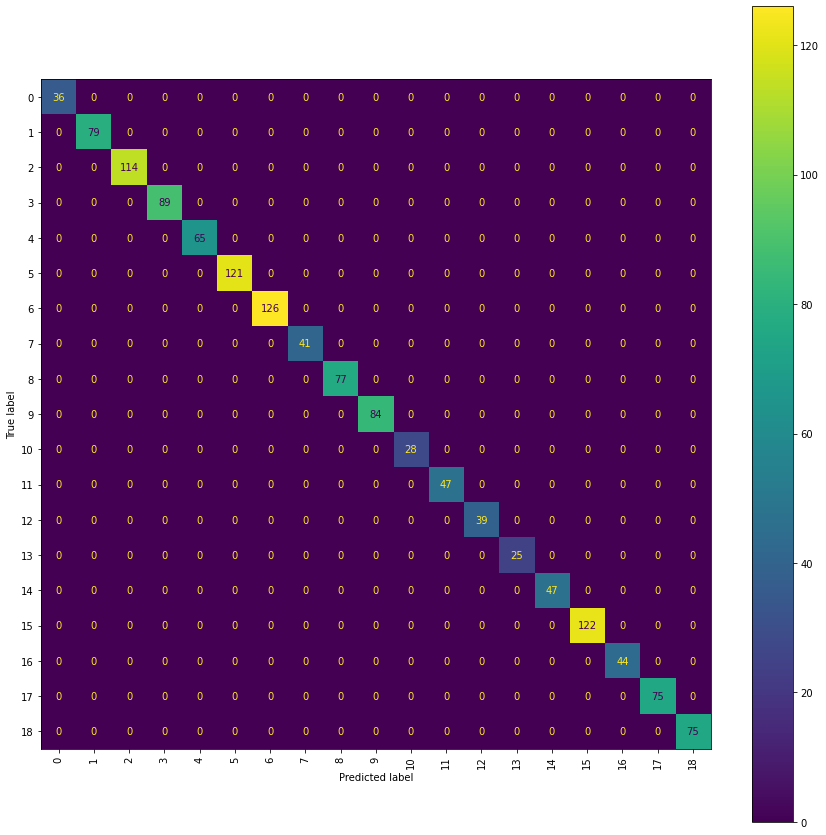

In [37]:
# confusion matrix to analyse the result.
con_matrix = confusion_matrix(y_test, y_pred, labels=voting_clf.classes_)
figure, axes = plt.subplots(1, figsize=(15,15))
disp = ConfusionMatrixDisplay(confusion_matrix=con_matrix, display_labels=voting_clf.classes_)
disp.plot(ax = axes, xticks_rotation='vertical')

# **Model Pickling**

In [38]:
#Pickling model
with open('Voting_Based_Model_Crop_Prediction_final.sav', 'wb') as pickle_file:
  pickle.dump(voting_clf, pickle_file)

In [40]:
from google.colab import files

files.download('Voting_Based_Model_Crop_Prediction_final.sav')
files.download('label_encoder.sav')
files.download('scaler.sav')
files.download('Feature_bi_variate_soil_properties.html')
files.download('Feature_bi_variate_climate_properties.html')
files.download('Feature_Univariate.html')
files.download('data_distribution.html')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [39]:
# Testing the saved model
def model_inference(feature_arr):
    print(os.path.getsize('Voting_Based_Model_Crop_Prediction_final.sav'))
    with open('Voting_Based_Model_Crop_Prediction_final.sav', 'rb') as pickle_file:
      model = pickle.load(pickle_file)
      prediction = model.predict(feature_arr)
      return prediction

arr = [[90,42,43,20.87974371,82.00274423,6.502985292,202.93553620, 2]]
arr = scaler.transform(arr)

pred = model_inference(arr)

print(pred[0])
print(target_labelencoder.inverse_transform(pred))

4667465
17
['rice']
